<a href="https://colab.research.google.com/github/SamuelFoo/ML/blob/master/Detectron2_50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!gcc --version
# opencv is pre-installed on colab

# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

# Get modified pycocotools for this competition
!pip uninstall -y pycocotools
! pip install git+https://github.com/jinmingteo/cocoapi.git#subdirectory=PythonAPI

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
     |████████████████████████████████| 276kB 8.0MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=ddc7c7bb7c74af36edffae55a05fbe35e2d5958d3970cf3f1151cb777ab85151
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# You may need to restart your runtime prior to this, to let your installation take effect
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

1.5.0+cu101 True


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

In [ ]:
# Import PyDrive and associated libraries.
# This only needs to be done once per notebook.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

def loadFromShared(file_id, path):
  downloaded = drive.CreateFile({'id': file_id}) 
  downloaded.GetContentFile(path)

In [ ]:
!cp gdrive/My\ Drive/ML/CV.zip CV.zip
!unzip -q CV.zip
!rm CV.zip
!mv CV/val CV/valid
!mv CV/val.json CV/valid.json
!mv CV/val.p CV/valid.p

In [ ]:
import json
import copy
import PIL

def insertHeightWidthIntoJson(annotationsFile, imageDir):
  outputFile = annotationsFile.split(".")[0]+"_1"+".json"

  with open(annotationsFile) as json_file:
      annotDict = json.load(json_file)
  imageDicts = annotDict["images"]
  annots = annotDict["annotations"]

  for imageDict in imageDicts:
    imageFile = imageDict['file_name']
    image = PIL.Image.open(imageDir+imageFile)
    width, height = image.size
    imageDict["width"] = width
    imageDict["height"] = height

  annot_id = 1
  for annot in annots:
    annot["id"] = annot_id
    annot_id += 1

  with open(outputFile, 'w') as f:
    json.dump(annotDict, f)

insertHeightWidthIntoJson("CV/train.json", "CV/train/")
insertHeightWidthIntoJson("CV/valid.json", "CV/valid/")

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train", {}, "CV/train_1.json", "CV/train")
register_coco_instances("valid", {}, "CV/valid_1.json", "CV/valid")

In [ ]:
from detectron2.engine import DefaultTrainer, SimpleTrainer
from detectron2.config import get_cfg
import os

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 4096   # No. of proposals, more the better (Default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)

# Train

In [ ]:
trainer.resume_or_load(resume=False)
trainer.train()

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (6, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (6,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (20, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (20,) in the model!


[06/19 08:17:29 d2.engine.train_loop]: Starting training from iteration 0
[06/19 08:17:41 d2.utils.events]:  eta: 0:26:31  iter: 19  total_loss: 1.826  loss_cls: 1.713  loss_box_reg: 0.062  loss_rpn_cls: 0.029  loss_rpn_loc: 0.013  time: 0.5521  data_time: 0.1268  lr: 0.000010  max_mem: 2731M
[06/19 08:17:53 d2.utils.events]:  eta: 0:26:41  iter: 39  total_loss: 1.622  loss_cls: 1.461  loss_box_reg: 0.084  loss_rpn_cls: 0.021  loss_rpn_loc: 0.013  time: 0.5653  data_time: 0.1092  lr: 0.000020  max_mem: 2731M
[06/19 08:18:04 d2.utils.events]:  eta: 0:26:28  iter: 59  total_loss: 1.172  loss_cls: 1.007  loss_box_reg: 0.060  loss_rpn_cls: 0.018  loss_rpn_loc: 0.010  time: 0.5620  data_time: 0.1042  lr: 0.000030  max_mem: 2731M
[06/19 08:18:15 d2.utils.events]:  eta: 0:26:24  iter: 79  total_loss: 0.639  loss_cls: 0.545  loss_box_reg: 0.056  loss_rpn_cls: 0.019  loss_rpn_loc: 0.012  time: 0.5651  data_time: 0.0904  lr: 0.000040  max_mem: 2731M
[06/19 08:18:28 d2.utils.events]:  eta: 0:26:1

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (123871510 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


[06/19 08:25:31 d2.utils.events]:  eta: 0:19:14  iter: 839  total_loss: 0.157  loss_cls: 0.062  loss_box_reg: 0.068  loss_rpn_cls: 0.016  loss_rpn_loc: 0.005  time: 0.5721  data_time: 0.3598  lr: 0.000420  max_mem: 2731M
[06/19 08:25:43 d2.utils.events]:  eta: 0:19:03  iter: 859  total_loss: 0.156  loss_cls: 0.064  loss_box_reg: 0.065  loss_rpn_cls: 0.013  loss_rpn_loc: 0.006  time: 0.5725  data_time: 0.1779  lr: 0.000430  max_mem: 2731M
[06/19 08:25:55 d2.utils.events]:  eta: 0:18:52  iter: 879  total_loss: 0.165  loss_cls: 0.070  loss_box_reg: 0.077  loss_rpn_cls: 0.010  loss_rpn_loc: 0.009  time: 0.5725  data_time: 0.0949  lr: 0.000440  max_mem: 2731M
[06/19 08:26:06 d2.utils.events]:  eta: 0:18:41  iter: 899  total_loss: 0.163  loss_cls: 0.068  loss_box_reg: 0.075  loss_rpn_cls: 0.013  loss_rpn_loc: 0.006  time: 0.5727  data_time: 0.1578  lr: 0.000450  max_mem: 2731M
[06/19 08:26:18 d2.utils.events]:  eta: 0:18:32  iter: 919  total_loss: 0.166  loss_cls: 0.076  loss_box_reg: 0.073 

In [ ]:
!mkdir output
# loadFromShared("1fjsvaVZYDZ5oklt2K4WoBVo9OOUieFMN", "output/detectron-6-50.pth")
# loadFromShared("1-8yqzYOUckKNMfaU4VEklL6L3Rsh5dCL", "output/detectron-11-50.pth")
loadFromShared("1-CsdJ6vPb87Vtth5oIwr-v9qeXemIDhe", "output/detectron-13-50.pth")


mkdir: cannot create directory ‘output’: File exists


In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.MAX_ITER = 33000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 327684   # No. of proposals, more the better (Default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR

trainer = DefaultTrainer(cfg);

trainer.resume_or_load(resume=True)
trainer.train()

[06/20 05:18:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!cp output/model_final.pth gdrive/My\ Drive/Colab\ Notebooks/detectron-23-50.pth

In [ ]:
'''
detectron-23-50: result: 0.603
'''

# Inference


In [ ]:
# !cp gdrive/My\ Drive/Colab\ Notebooks/detectron-1.pth output/detectron-1.pth

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05   # set the testing threshold for this model
cfg.DATASETS.TEST = ("valid", )
fashionMetadata = MetadataCatalog.get("train")
predictor = DefaultPredictor(cfg)
trainer = DefaultTrainer(cfg);

[06/20 05:10:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
with open("CV/valid_1.json") as json_file:
  validDict = json.load(json_file)
  imageDicts = validDict["images"]

Boxes(tensor([[ 668.6716, 1201.4840, 1166.8193, 2209.8862],
        [ 831.4764, 2145.5278, 1045.5258, 2710.5745],
        [ 647.6293, 1191.5770, 1196.8242, 1825.5920],
        [ 699.6926, 1469.2963, 1167.0518, 2217.6526],
        [ 722.1772, 1188.4359, 1104.1534, 1567.2996],
        [ 695.2873, 1177.4115, 1147.3851, 1879.1102],
        [ 797.7501, 2108.2439, 1200.2904, 2705.2861],
        [ 671.1164, 1191.9188, 1149.0847, 1533.8063],
        [ 808.8200, 2120.6931, 1055.0133, 2424.2122],
        [ 746.0949, 1526.4963, 1133.0059, 2191.3269],
        [ 806.3705, 1226.0547, 1012.4005, 1539.4741],
        [ 724.7413, 1786.7697, 1149.3826, 2185.9827],
        [ 828.4653, 2142.7007,  912.5506, 2406.5952],
        [ 735.3458, 1265.9065, 1062.6475, 1465.7673],
        [ 710.5153, 1201.8135, 1062.0773, 1390.4263],
        [ 657.2679, 1323.6677, 1202.0875, 2633.0095],
        [ 791.0812, 2160.4268,  912.5936, 2731.8311],
        [ 446.5557, 1235.2341, 1422.6993, 2215.2251],
        [ 736.6922, 12

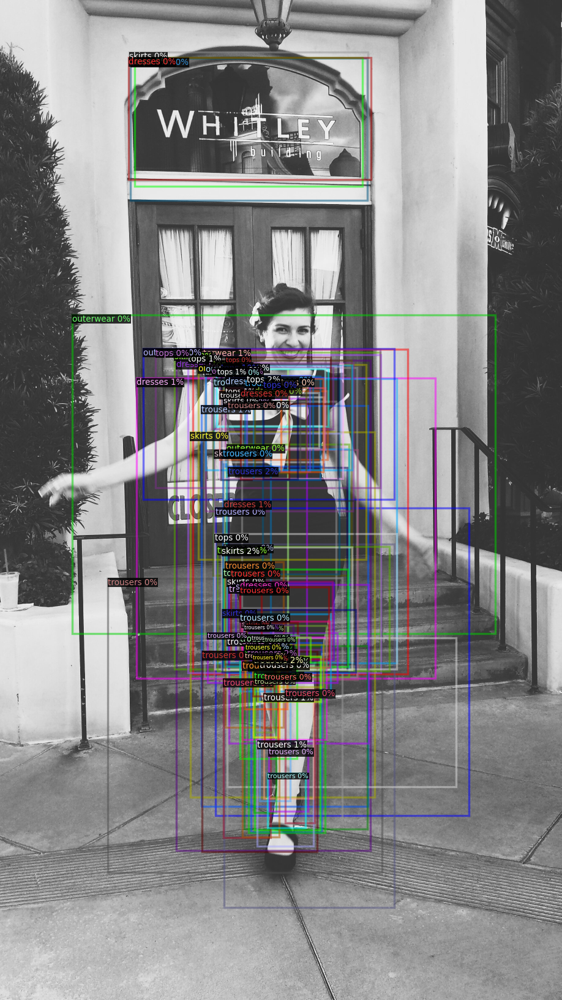

Boxes(tensor([[ 337.5792, 1155.0437, 1697.9425, 3555.3638],
        [ 343.6661, 1828.1174, 1660.4573, 3620.3047],
        [ 383.9200,  993.9858, 1728.1442, 2461.3948],
        [ 361.9948, 1040.7601, 1645.0129, 2700.0137],
        [ 412.1967,  967.6746, 1541.7778, 1759.9817],
        [ 497.0787, 1036.0862, 1346.8754, 1555.8354],
        [ 870.8945, 1031.4352, 1260.6089, 1790.7253],
        [ 363.8041, 2843.7505, 1649.1008, 3540.2983],
        [ 434.0284, 1489.7335, 1614.0347, 3595.9111],
        [ 320.5891, 1016.5651, 1737.7560, 3589.1018],
        [ 699.8151, 1012.2237, 1142.4355, 1736.9758],
        [ 387.3708, 2347.2771, 1600.2104, 3528.7883],
        [ 369.4666,  977.0083, 1506.8738, 1809.5739],
        [ 732.5936, 4233.4028,  993.1862, 4540.2529],
        [ 416.8186, 1760.0029, 1617.3920, 3676.9392],
        [ 452.6128, 3446.6211, 1439.4822, 4572.0000],
        [ 939.4396, 3430.0474, 1071.5688, 3487.8591],
        [ 344.7452,  992.0467, 1607.5472, 2463.3384],
        [ 772.3673,  9

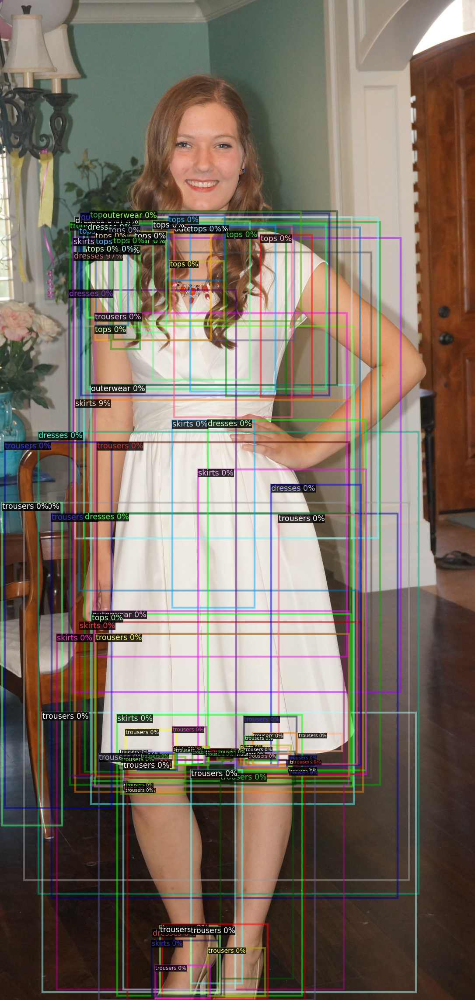

Boxes(tensor([[ 410.6616, 1002.2612, 2325.6406, 3406.3857],
        [1178.6624, 3327.2947, 2108.6770, 4482.9985],
        [1304.9857, 3728.3220, 1622.3304, 4559.0435],
        [ 393.9060, 1820.3101, 2267.8989, 3375.0591],
        [1218.0216, 3408.7019, 1681.7068, 4640.7612],
        [1401.5192,  935.1133, 2411.6438, 1859.0746],
        [1426.8801,  932.8807, 2351.0774, 1908.5050],
        [ 744.0944,  820.8628, 2468.5044, 2333.2854],
        [1392.0294,  967.3906, 2403.6755, 2127.0974],
        [1222.4312,  981.4385, 2458.9250, 3131.5100],
        [1358.9094, 4012.0435, 1584.2292, 4512.0205],
        [1932.3820, 4149.9458, 2269.6250, 4801.3213],
        [1249.7910, 3461.0244, 2111.9067, 4475.6538],
        [1141.3372, 3259.8704, 1720.8763, 4169.2764],
        [1104.6222, 3291.7971, 2533.7961, 4859.2690],
        [1285.4802, 3720.5383, 2239.7793, 4797.1538],
        [1247.1174, 3498.1575, 2089.3667, 4494.9878],
        [1297.2590, 3639.6619, 1890.3904, 4474.2319],
        [1131.1082, 32

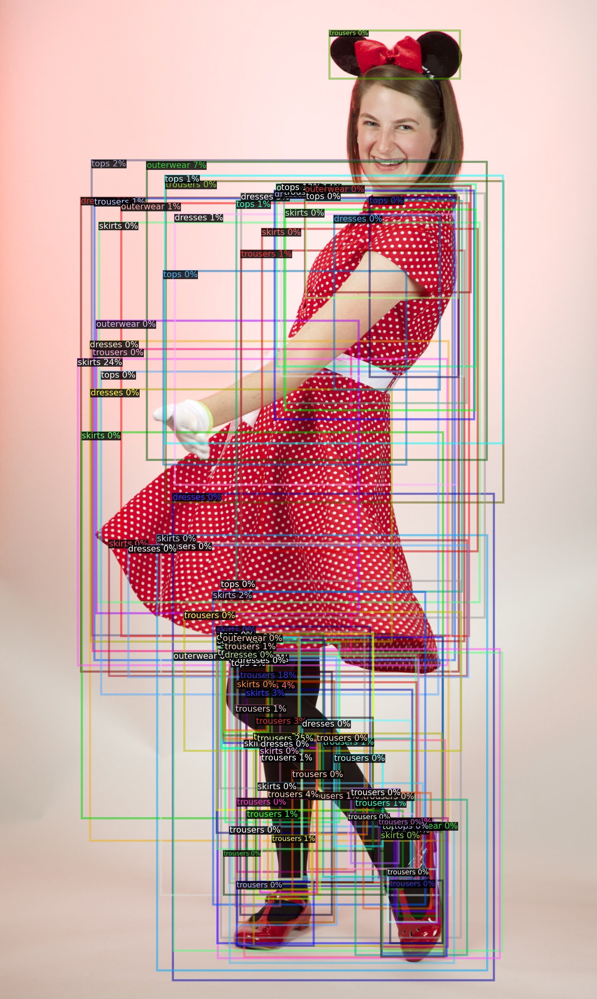

Boxes(tensor([[ 918.3718, 1075.3453, 2147.5701, 2637.7031],
        [1202.6228, 1030.6105, 2044.1978, 1682.7457],
        [1157.6904, 1020.0001, 2106.7329, 1740.3459],
        [ 859.7916, 1618.1503, 2116.9351, 2595.5867],
        [1260.3362, 2684.0193, 1503.0361, 3235.1169],
        [1186.5989, 1055.3572, 2081.8093, 1872.0098],
        [1553.5453, 2733.0171, 1778.6521, 3264.0000],
        [1005.8420,  978.2236, 2130.6191, 2121.9502],
        [ 892.7488,  987.0894, 2196.4651, 2272.7690],
        [1459.6523, 2605.9236, 1826.9210, 3247.3748],
        [1008.9035, 2270.6980, 2324.4961, 3255.6240],
        [1473.7140, 1058.9769, 1729.1239, 1353.8711],
        [ 936.5335, 1803.1777, 2124.9897, 2588.9819],
        [ 872.2203, 1365.1119, 2155.8098, 2630.2917],
        [1400.5637, 1027.4706, 1834.2335, 1609.4077],
        [1650.9200, 2485.6252, 2339.4797, 3223.9622],
        [1286.8467, 2514.3513, 1536.6041, 2750.9084],
        [1291.9739, 2886.6160, 1476.8625, 3202.7358],
        [1315.5540, 30

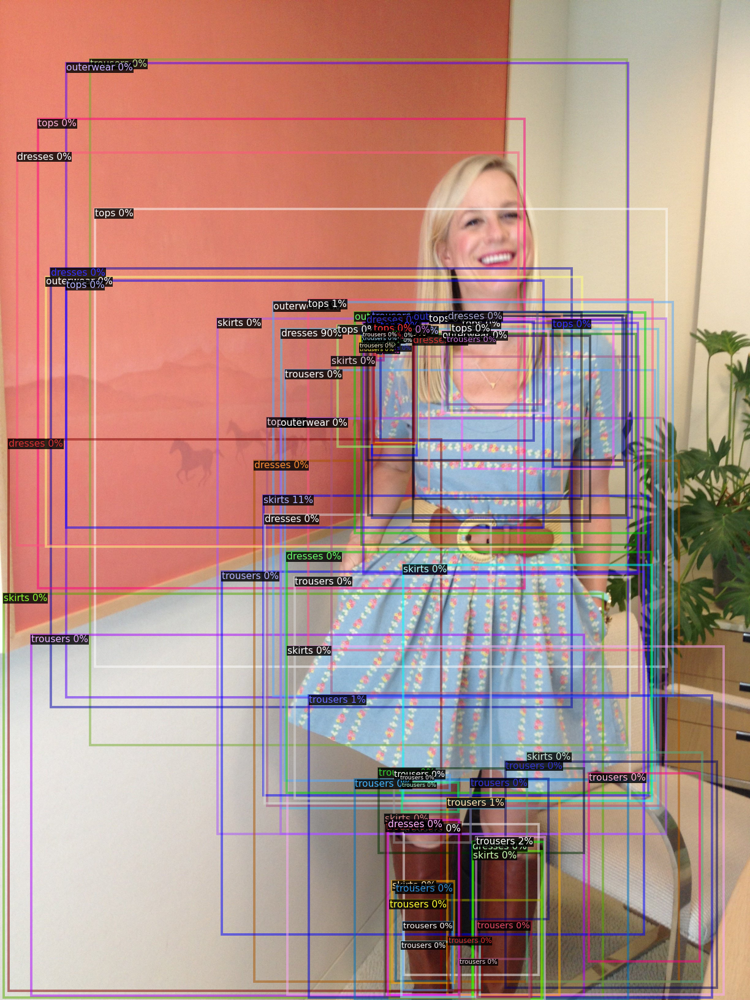

Boxes(tensor([[3.2994e+02, 7.3619e+01, 7.6542e+02, 7.3840e+02],
        [8.1777e+00, 2.0053e+02, 2.6010e+02, 8.4480e+02],
        [6.6930e+02, 0.0000e+00, 8.9074e+02, 1.6368e+02],
        [6.7899e+02, 0.0000e+00, 8.9113e+02, 1.5860e+02],
        [3.5567e+02, 4.4618e+01, 8.5013e+02, 4.9468e+02],
        [6.5846e+02, 0.0000e+00, 8.9600e+02, 1.6760e+02],
        [3.0592e+02, 0.0000e+00, 8.4686e+02, 1.1058e+03],
        [0.0000e+00, 1.0953e+02, 3.0139e+02, 8.8624e+02],
        [4.5578e+02, 7.1148e+02, 6.6254e+02, 1.1173e+03],
        [0.0000e+00, 1.8006e+02, 2.5661e+02, 8.0250e+02],
        [6.7172e+02, 0.0000e+00, 8.9600e+02, 1.5883e+02],
        [3.9821e+02, 9.8872e-01, 8.6917e+02, 1.8117e+02],
        [3.4120e+02, 1.4391e+02, 7.5978e+02, 7.6282e+02],
        [3.5098e+02, 5.4170e+01, 8.2145e+02, 5.6721e+02],
        [3.0845e+01, 7.2405e+02, 1.7247e+02, 8.5327e+02],
        [6.6606e+02, 0.0000e+00, 8.9439e+02, 1.6719e+02],
        [4.4798e+02, 0.0000e+00, 8.9600e+02, 1.9407e+02],
        

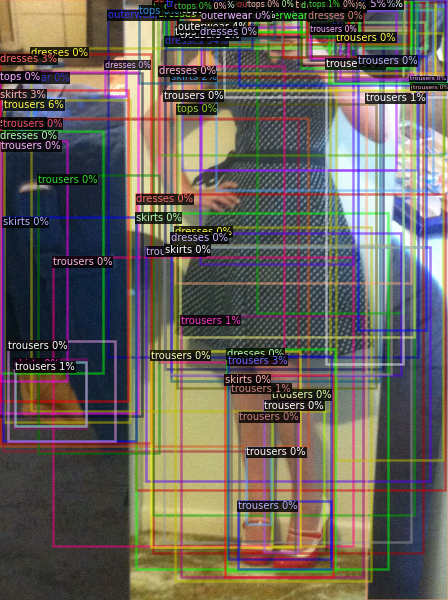

In [ ]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.0   # set the testing threshold for this model

predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode

for d in random.sample(imageDicts, 5):    
    im = cv2.imread("CV/valid/"+d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashionMetadata, 
                   scale=0.5
                  #  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    print(outputs["instances"].pred_boxes)
    print(outputs["instances"].scores)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    # break

In [ ]:
# given classes: [{"id": 1, "name": "tops"}, {"id": 2, "name": "trousers"}, {"id": 3, "name": "outerwear"}, {"id": 4, "name": "dresses"}, {"id": 5, "name": "skirts"}]
# metadata: ['tops', 'trousers', 'outerwear', 'dresses', 'skirts']

detections = []

for i in range(len(imageDicts)):
    if i % 10 == 0:
      print(i, "of", len(imageDicts))
    
    imageDict = imageDicts[i]

    im = cv2.imread("CV/valid/"+imageDict["file_name"])
    outputs = predictor(im)
    instances = outputs['instances']
    pred_boxes = instances.pred_boxes
    scores = instances.scores
    classes = instances.pred_classes

    for j in range(len(pred_boxes)):
      x1, y1, x2, y2 = list(pred_boxes[j])[0].tolist()
      detections.append( {'image_id':imageDict['id'], 'category_id':classes[j].item()+1,
                          'bbox':[x1, y1, x2-x1, y2-y1], 'score':scores[j].item()} )

0 of 1474
10 of 1474
20 of 1474
30 of 1474
40 of 1474
50 of 1474
60 of 1474
70 of 1474
80 of 1474
90 of 1474
100 of 1474
110 of 1474
120 of 1474
130 of 1474
140 of 1474
150 of 1474
160 of 1474
170 of 1474
180 of 1474
190 of 1474
200 of 1474
210 of 1474
220 of 1474
230 of 1474
240 of 1474
250 of 1474
260 of 1474
270 of 1474
280 of 1474
290 of 1474
300 of 1474
310 of 1474
320 of 1474
330 of 1474
340 of 1474
350 of 1474
360 of 1474
370 of 1474
380 of 1474
390 of 1474
400 of 1474
410 of 1474
420 of 1474
430 of 1474
440 of 1474
450 of 1474
460 of 1474
470 of 1474
480 of 1474
490 of 1474
500 of 1474
510 of 1474
520 of 1474
530 of 1474
540 of 1474
550 of 1474
560 of 1474
570 of 1474
580 of 1474
590 of 1474
600 of 1474
610 of 1474
620 of 1474
630 of 1474
640 of 1474
650 of 1474
660 of 1474
670 of 1474
680 of 1474
690 of 1474
700 of 1474
710 of 1474
720 of 1474
730 of 1474
740 of 1474
750 of 1474
760 of 1474
770 of 1474
780 of 1474
790 of 1474
800 of 1474
810 of 1474
820 of 1474
830 of 1474
840

In [ ]:
with open('CV/detections.json', 'w') as f:
  json.dump(detections, f)

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70%. Not bad!

In [ ]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

import numpy
numpy.__version__

# Get evaluation score against validation set
coco_gt = COCO('CV/valid.json')
coco_dt = coco_gt.loadRes('CV/detections.json')
cocoEval = COCOeval(cocoGt=coco_gt, cocoDt=coco_dt, iouType='bbox')
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Loading and preparing results...
DONE (t=1.36s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.53s).
Accumulating evaluation results...
DONE (t=1.62s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.603
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.426
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.522
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.644
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets